# Muldrow Glacier Analysis

This code will read in our geocoded and cropped SAR images over the Muldrow Glacier, sort them by dates, zoom in on our area of interest, and create a time series gif of the glacier motion. The next step here is to import openCV and try out the dense optical flow algorithm to extract velocity fields.

In [1]:
!pip install geopandas
!pip install rioxarray
!pip install rasterio
!pip install openpiv

     |████████████████████████████████| 1.0MB 8.8MB/s 
     |████████████████████████████████| 6.6MB 20.5MB/s 
     |████████████████████████████████| 15.3MB 255kB/s 
     |████████████████████████████████| 51kB 4.0MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 19.1MB 1.4MB/s 
  Created wheel for rioxarray: filename=rioxarray-0.4.1.post0-cp37-none-any.whl size=51751 sha256=0379317b32667f89f453b5ebcbfe686e6280847b235d21c6d287d37c6a9c1bcb
  Stored in directory: /root/.cache/pip/wheels/f4/0e/b8/bbae7f8384ce9e845ea9c3f94dd83ab7f3e5db8ec52d7e81ab
Successfully built rioxarray
     |████████████████████████████████| 91.1MB 64kB/s 
     |████████████████████████████████| 174kB 38.0MB/s 
     |████████████████████████████████| 71kB 9.6MB/s 


In [2]:
!git clone https://github.com/egagli/glacier-velocity-from-sar

Cloning into 'glacier-velocity-from-sar'...
remote: Enumerating objects: 215, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 215 (delta 11), reused 46 (delta 11), pack-reused 169
Receiving objects: 100% (215/215), 299.30 MiB | 29.09 MiB/s, done.
Resolving deltas: 100% (82/82), done.
Checking out files: 100% (29/29), done.


In [3]:
import geopandas as gpd
import os
import rasterio as rio
from rasterio import plot, mask
import matplotlib.pyplot as plt
import numpy as np
import rioxarray
import pandas as pd
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

In [4]:
geo_crop_dir = '/content/glacier-velocity-from-sar/import_data/import_sar_asf_script/sar_images_geocoded_cropped'

In [5]:
muldrow = gpd.read_file('/content/glacier-velocity-from-sar/import_data/import_glacier_shapefiles_rgi/muldrow_glacier.geojson')

## Extract dates from files and sort SAR images by date

In [6]:
file_list = []
date_list = []
for file in os.listdir(geo_crop_dir):
    if file != '.ipynb_checkpoints':
        file_list.append(file)
        date = pd.to_datetime(file[14:29])
        date_list.append(date)

In [7]:
date_list.sort()
file_list.sort()

## Take the log of each SAR image and display with accompanying colorbar

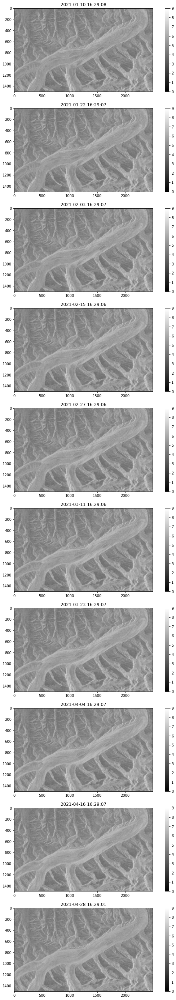

In [8]:
f,ax=plt.subplots(len(file_list),1,figsize=(12,50))
for i,file in enumerate(file_list):
    sar_image = plt.imread(f'{geo_crop_dir}/{file}')
    sar_image_log = np.log(sar_image,where=(sar_image!=0))
    color = ax[i].imshow(sar_image_log[1000:2500,1000:3500],cmap='gray',vmin=0,vmax=9)
    ax[i].set_title(date_list[i])
    f.colorbar(color,ax=ax[i])

## Create and save a gif of the SAR time series stack

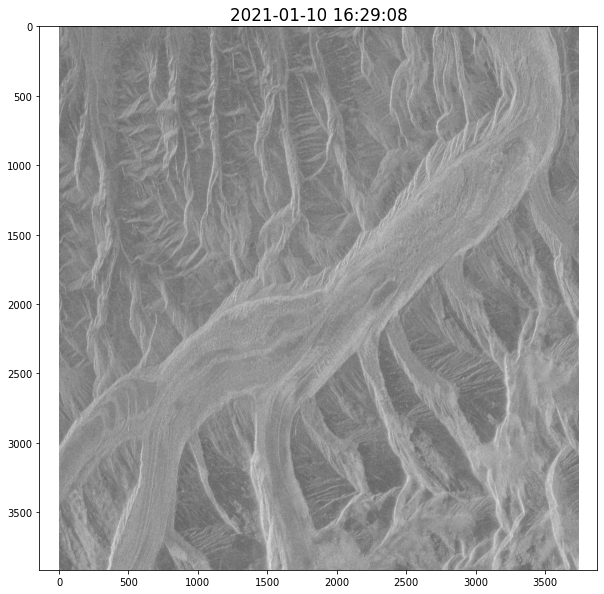

In [9]:
f,ax=plt.subplots(figsize=(10,10))
plt.rcParams.update({'font.size': 14})

sar_image = plt.imread(f'{geo_crop_dir}/{file_list[0]}')
im = ax.imshow(np.log(sar_image,where=(sar_image!=0)),cmap='gray')
ax.set_title(date_list[0])

def update(frame):
    sar_image = plt.imread(f'{geo_crop_dir}/{file_list[frame]}')
    sar_image_log = np.log(sar_image,where=(sar_image!=0))
    im.set_data(sar_image_log[1000:2500,1000:3500])
    ax.set_title(date_list[frame])
    ax.axis('equal')


ani = FuncAnimation(f, update, frames=len(file_list), blit=False, interval=300)

In [10]:
HTML(ani.to_jshtml())

In [11]:
ani.save('muldrow_timeseries_subset.gif', writer='pillow', fps=2)

In [12]:
#TODO: create notebooks to try out different approaches
# whatever way we learn in class
# look at opencv tools, for example: https://docs.opencv.org/master/d7/df3/group__imgproc__motion.html
# speckle offset tracking
# https://mudic.readthedocs.io/en/latest/examples/example.html
# for validation: https://docs.terradue.com/ellip/solutions/notebooks/examples/polar/resources/code/polarstern/04-glacier-velocity.html
# ...

## Dense Optical Flow



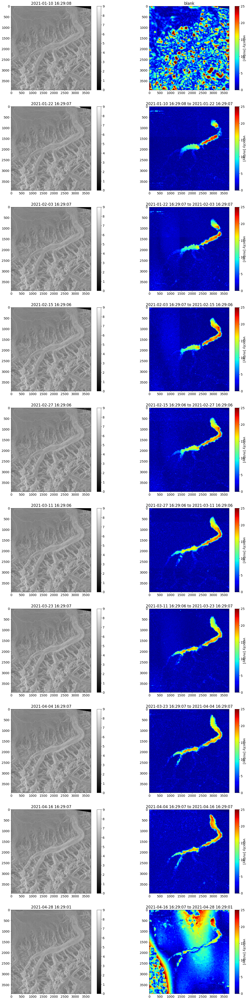

In [13]:
import glob
import cv2 as cv
import numpy as np
from tqdm import notebook
from matplotlib import pyplot as plt

dims = cv.imread(f'{geo_crop_dir}/{file_list[0]}')
first_frame = cv.imread(f'{geo_crop_dir}/{file_list[0]}',cv.IMREAD_UNCHANGED)

prev_frame = np.log(first_frame,where=(first_frame!=0))
mask = np.zeros_like(dims)
mask[..., 1] = 255

f,ax=plt.subplots(len(file_list),2,figsize=(20,80))
for i, filename in notebook.tqdm(enumerate(file_list)):  
    frame = cv.imread(f'{geo_crop_dir}/{filename}',cv.IMREAD_UNCHANGED)
    gray = np.log(frame,where=(frame!=0))

    colorb = ax[i,0].imshow(gray,vmin=0,vmax=9,cmap='gray')
    f.colorbar(colorb,ax=ax[i,0])
    ax[i,0].set_title(date_list[i])
    
    
    flow = cv.calcOpticalFlowFarneback(prev_frame, frame, 
                                       None,
                                       0.5, 3, 15, 3, 5, 1.1, 0)
      
    magnitude, angle = cv.cartToPolar(flow[..., 0], flow[..., 1])

    mask[..., 0] = angle * 180 / np.pi / 2
      
    mask[..., 2] = cv.normalize(magnitude, None, 0, 255, cv.NORM_MINMAX)
      
    rgb = cv.cvtColor(mask, cv.COLOR_HSV2BGR)
      
    #ax[i,1].imshow(rgb)
    colorb2 = ax[i,1].imshow(magnitude*(10/12),vmin=0,vmax=25,cmap='jet') 
    cbar = f.colorbar(colorb2,ax=ax[i,1])
    cbar.set_label('velocity [m/day]', rotation=270)
    if i == 0:
      ax[i,1].set_title('blank')
    else:
      ax[i,1].set_title(f'{date_list[i-1]} to {date_list[i]}')
      
    prev_frame = frame

#Particle Image Velocimetry

In [14]:
from openpiv import tools, pyprocess, validation, filters, scaling 

In [15]:
frame_a  = tools.imread(f'{geo_crop_dir}/{file_list[0]}')
frame_b  = tools.imread(f'{geo_crop_dir}/{file_list[1]}')

frame_a = np.log(frame_a,where=(frame_a!=0))
frame_b = np.log(frame_b,where=(frame_b!=0))

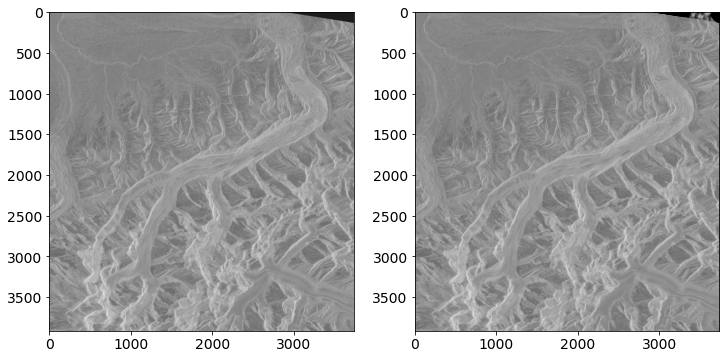

In [25]:
fig,ax = plt.subplots(1,2,figsize=(12,10))
ax[0].imshow(frame_a,cmap=plt.cm.gray,vmin=0,vmax=9)
ax[1].imshow(frame_b,cmap=plt.cm.gray,vmin=0,vmax=9)

In [64]:
winsize = 16 # pixels, interrogation window size in frame A
searchsize = 20  # pixels, search in image B
overlap = 8 # pixels, 50% overlap
dt = 1.037E6 # sec, time interval between pulses


u0, v0, sig2noise = pyprocess.extended_search_area_piv(frame_a.astype(np.int32), 
                                                       frame_b.astype(np.int32), 
                                                       window_size=winsize, 
                                                       overlap=overlap, 
                                                       dt=dt, 
                                                       search_area_size=searchsize, 
                                                       sig2noise_method='peak2peak')

In [65]:
x, y = pyprocess.get_coordinates( image_size=frame_a.shape, 
                                 search_area_size=searchsize, 
                                 overlap=overlap )

In [66]:
u1, v1, mask = validation.sig2noise_val( u0, v0, 
                                        sig2noise, 
                                        threshold = 1.05 )
# if you need more detailed look, first create a histogram of sig2noise
# plt.hist(sig2noise.flatten())
# to see where is a reasonable limit

In [67]:
# filter out outliers that are very different from the
# neighbours

u2, v2 = filters.replace_outliers( u1, v1, 
                                  method='localmean', 
                                  max_iter=1, 
                                  kernel_size=3)

In [68]:
# convert x,y to mm
# convert u,v to mm/sec

x, y, u3, v3 = scaling.uniform(x, y, u2, v2, 
                               scaling_factor = 0.1 ) # 96.52 microns/pixel

# 0,0 shall be bottom left, positive rotation rate is counterclockwise
x, y, u3, v3 = tools.transform_coordinates(x, y, u3, v3)

In [69]:
#save in the simple ASCII table format
tools.save(x, y, u3, v3, mask, 'exp1_001.txt' )

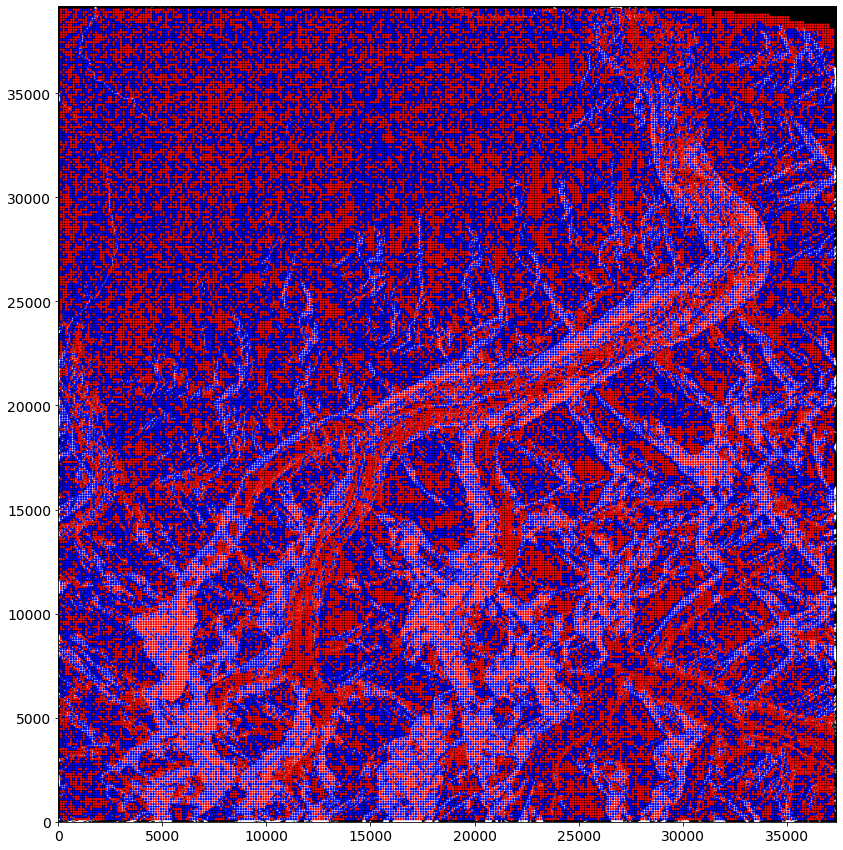

In [71]:
fig, ax = plt.subplots(figsize=(15,15))
tools.display_vector_field('exp1_001.txt', 
                           ax=ax, scaling_factor=0.1, 
                           scale=50, # scale defines here the arrow length
                           width=0.0035, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           image_name=f'{geo_crop_dir}/{file_list[0]}');

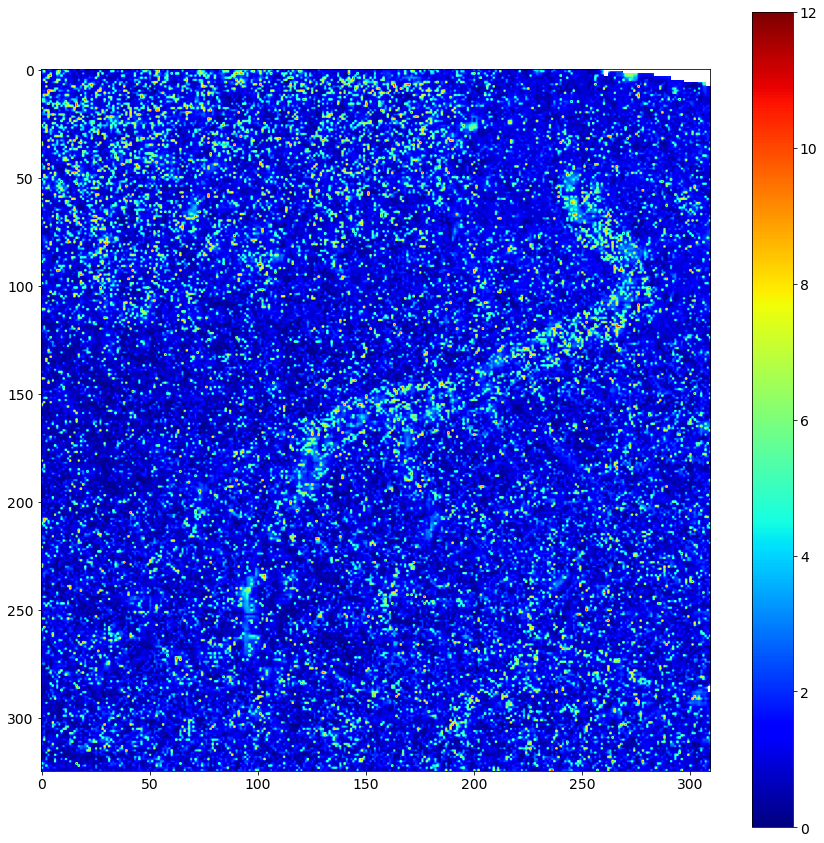

In [75]:
f,ax=plt.subplots(figsize=(15,15))
colors = ax.imshow(np.sqrt(u3**2+v3**2)*60*60*24,cmap='jet',vmin=0,vmax=12)
f.colorbar(colors)

In [ ]:
winsize = 16 # pixels, interrogation window size in frame A
searchsize = 20  # pixels, search in image B
overlap = 8 # pixels, 50% overlap
dt = 1.037E6 # sec, time interval between pulses

f,ax=plt.subplots(len(file_list),2,figsize=(20,80))
for i, filename in notebook.tqdm(enumerate(file_list)): 

  if i == 0:
    frame_a  = tools.imread(f'{geo_crop_dir}/{file_list[0]}')
    colorb = ax[i,0].imshow(frame_a,vmin=0,vmax=9,cmap='gray')
    f.colorbar(colorb,ax=ax[i,0])
    ax[i,0].set_title(date_list[0])
    continue
    
  frame_a  = tools.imread(f'{geo_crop_dir}/{file_list[i-1]}')
  frame_b  = tools.imread(f'{geo_crop_dir}/{file_list[i]}')
  frame_a = np.log(frame_a,where=(frame_a!=0))
  frame_b = np.log(frame_b,where=(frame_b!=0))  

  colorb = ax[i,0].imshow(frame_b,vmin=0,vmax=9,cmap='gray')
  f.colorbar(colorb,ax=ax[i,0])
  ax[i,0].set_title(date_list[i])


  u0, v0, sig2noise = pyprocess.extended_search_area_piv(frame_a.astype(np.int32), 
                                                       frame_b.astype(np.int32), 
                                                       window_size=winsize, 
                                                       overlap=overlap, 
                                                       dt=dt, 
                                                       search_area_size=searchsize, 
                                                       sig2noise_method='peak2peak')
  x, y = pyprocess.get_coordinates( image_size=frame_a.shape, 
                                 search_area_size=searchsize, 
                                 overlap=overlap )
  u1, v1, mask = validation.sig2noise_val( u0, v0, 
                                        sig2noise, 
                                        threshold = 1.05 )
  u2, v2 = filters.replace_outliers( u1, v1, 
                                  method='localmean', 
                                  max_iter=1, 
                                  kernel_size=3)
  x, y, u3, v3 = scaling.uniform(x, y, u2, v2, 
                               scaling_factor = 0.1 ) # 96.52 microns/pixel
  # 0,0 shall be bottom left, positive rotation rate is counterclockwise
  x, y, u3, v3 = tools.transform_coordinates(x, y, u3, v3)


  colorb2 = ax[i,1].imshow(np.sqrt(u3**2+v3**2)*60*60*24,vmin=0,vmax=25,cmap='jet') 
  cbar = f.colorbar(colorb2,ax=ax[i,1])
  cbar.set_label('velocity [m/day]', rotation=270)
  if i == 0:
    ax[i,1].set_title('blank')
  else:
    ax[i,1].set_title(f'{date_list[i-1]} to {date_list[i]}')    